Image processing and computer vision tasks include displaying, cropping, flipping, rotating,  image segmentation, classification, image restoration,  image recognition, image generation.  Also, working with images via the cloud requires storing, transmitting, and gathering images through the internet. 

Python is an excellent choice as it has many image processing tools, computer vision and artificial intelligence libraries. Finally, it has many libraries for working with files in the cloud and on the internet.

A digital image is simply a file in your computer. In this lab, you will gain an understanding of these files and learn to work with these files with the Pillow Library (PIL).

<ul>
    <li><a href='#PIL'>Python Image Libraries </a>
        <ul>
            <li>Image Files and Paths  </li>
            <li>Load in Image in Python</li>
            <li>Plotting an Image </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
            <li> PIL Images into NumPy Arrays  </li>
        </ul>
    </li>
    
</ul>


Download the images for the lab:


In [57]:
image_urls = ['https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png',
            'https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png',
            'https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png']

In [58]:
filename_urls = ['lenna.png',
                 'baboon.png',
                 'barbara.png']

In [59]:
import requests

def download_images(filenames, urls):
    for filename, url in zip(filenames, urls):
        response = requests.get(url)
        if response.status_code == 200:
            with open(filename, "wb") as f:
                f.write(response.content)
            print(f"File downloaded as {filename}")
        else:
            print(f"Failed to download file: {response.status_code}")

In [60]:
download_images(filename_urls, image_urls)

File downloaded as lenna.png
File downloaded as baboon.png
File downloaded as barbara.png


First, let's define a helper function to concatenate two images side-by-side. You will not need to understand the code below at this moment, but this function will be used repeatedly in this tutorial to showcase the results.

In [61]:
def get_concat_h(im1, im2):
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

Defining image paths

In [62]:
lenna_IMG = 'lenna.png'
baboon_IMG = 'baboon.png'
barbara_IMG = 'barbara.png'

images = [lenna_IMG,baboon_IMG, barbara_IMG]

## Load Images in Python

OpenCV is a library used for computer vision. It has more functionality than the `PIL` library but is more difficult to use. We can import `OpenCV` as follows:

The <code>imread()</code> method loads an image from the specified file, the input is the <code>path</code> of the image to be read (just like PIL), the <code>flag</code> paramter specifies how the image should be read, and the default value is <code>cv2.IMREAD_COLOR</code>.


In [63]:
import cv2

def loadimage(images):
    for image_path in images:
        image = cv2.imread(image_path)
        print(f"Image type: {type(image)}")  # The result is a numpy array with intensity values as 8-bit unsigned integers. 
        image.shape  # We can get the shape of the array from the `shape` attribute.
        #The shape is the same as the PIL array, but there are several differences; for example, PIL returns in (R, G, B) format whereas OpenCV returns in (B, G, R) format.

        #Each pixel could take on 256 possible values as intensity, ranging from 0 to 255, with 0 being the lowest intensity and 255 being the highest. 
        # The maximum and minimum intensity values of an image can be obtained, respectively, by calling:

        image.max

        #and 
        image.min


loadimage(images)

Image type: <class 'numpy.ndarray'>
Image type: <class 'numpy.ndarray'>
Image type: <class 'numpy.ndarray'>


In [75]:
my_image = "lenna.png"
image = cv2.imread(my_image)
new_image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
cv2.imwrite("lenna.jpg", image)

True

##  Plotting an Image 


You can use OpenCV's `imshow` function to open the image in a new window, but this may give you some issues in Jupyter:


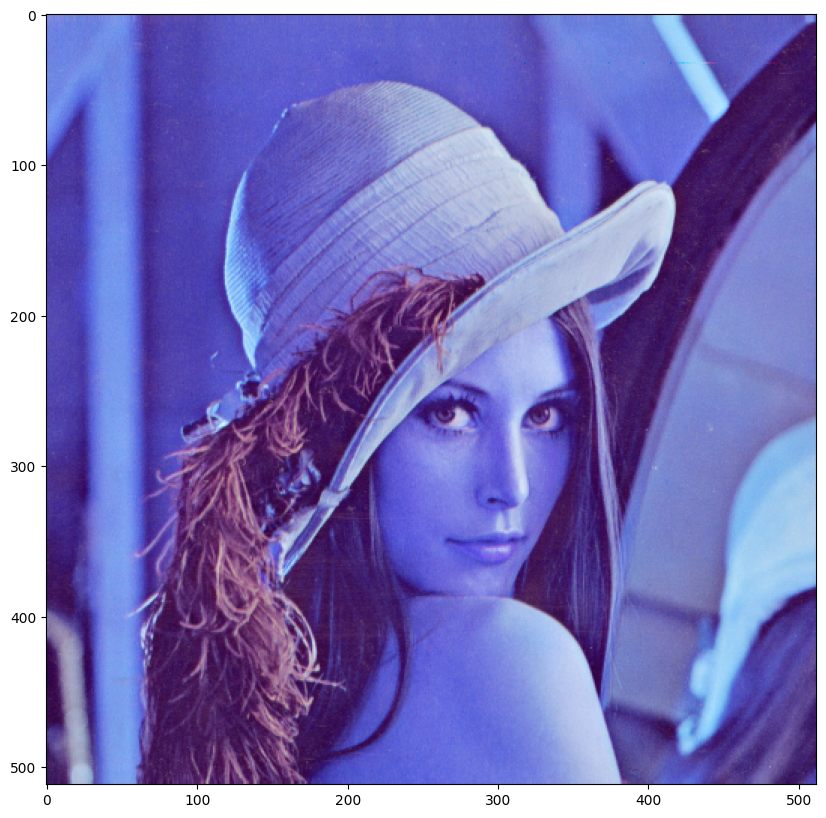

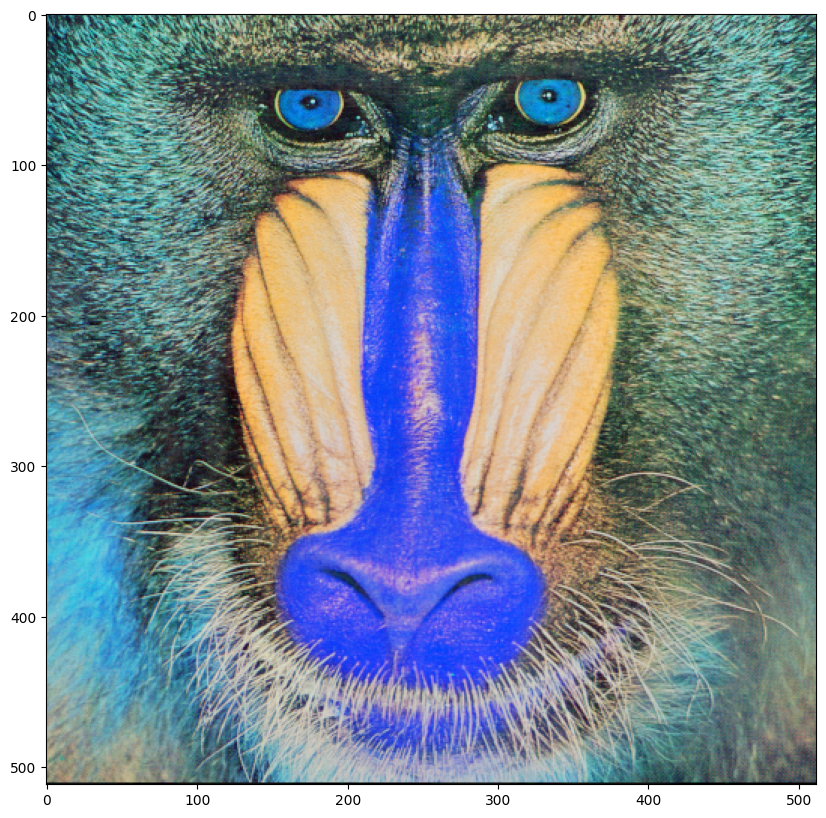

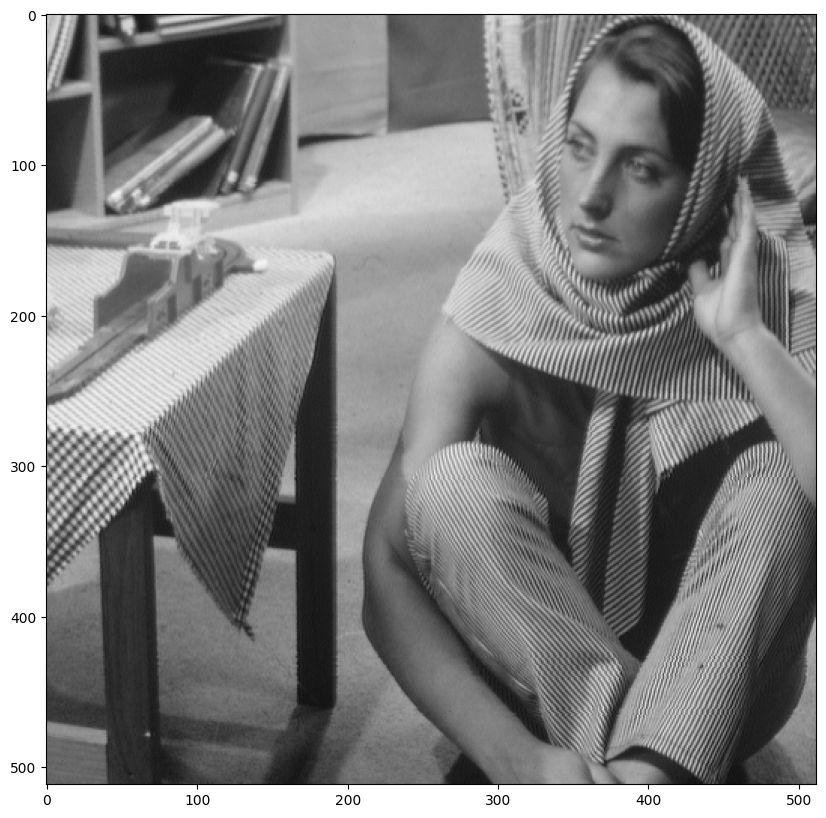

In [65]:
import matplotlib.pyplot as plt

def loadimage(images):
    for image_path in images:
        image = cv2.imread(image_path)
        plt.figure(figsize=(10,10))
        plt.imshow(image)
        plt.show()


loadimage(images)

The image output doesn't look natural. This is because the order of RGB Channels are different. We can change the color space with conversion code and the function `cvtColor` from the `cv2` library:


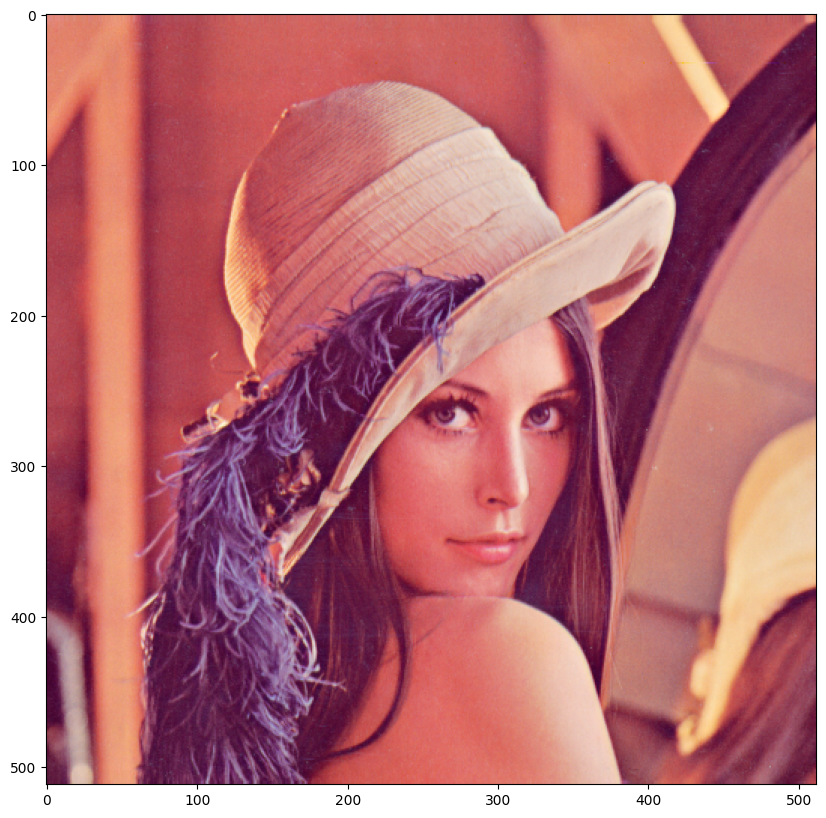

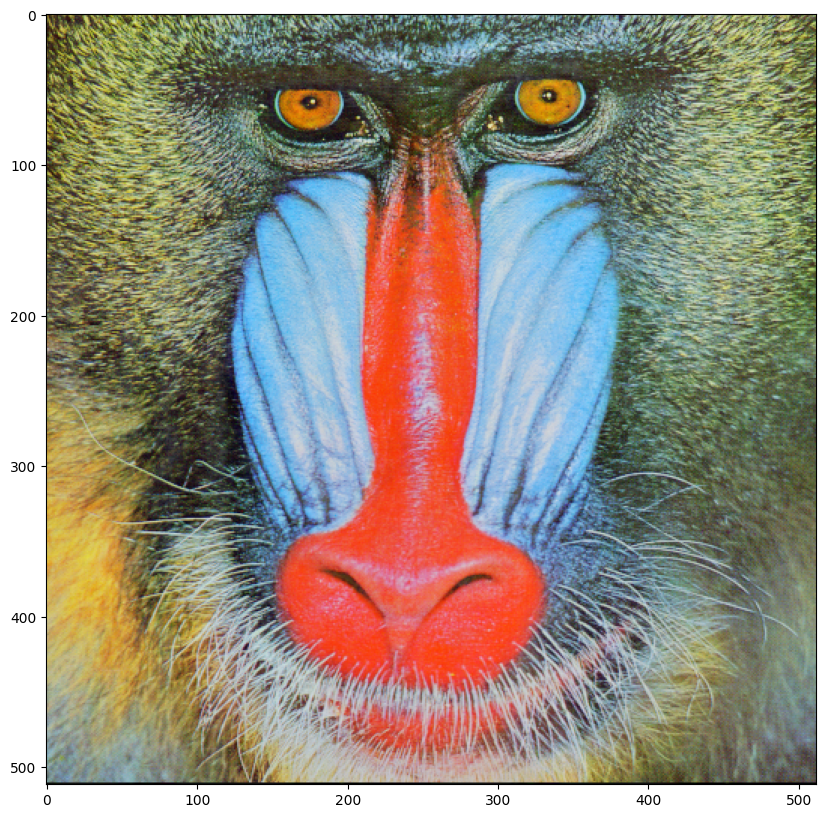

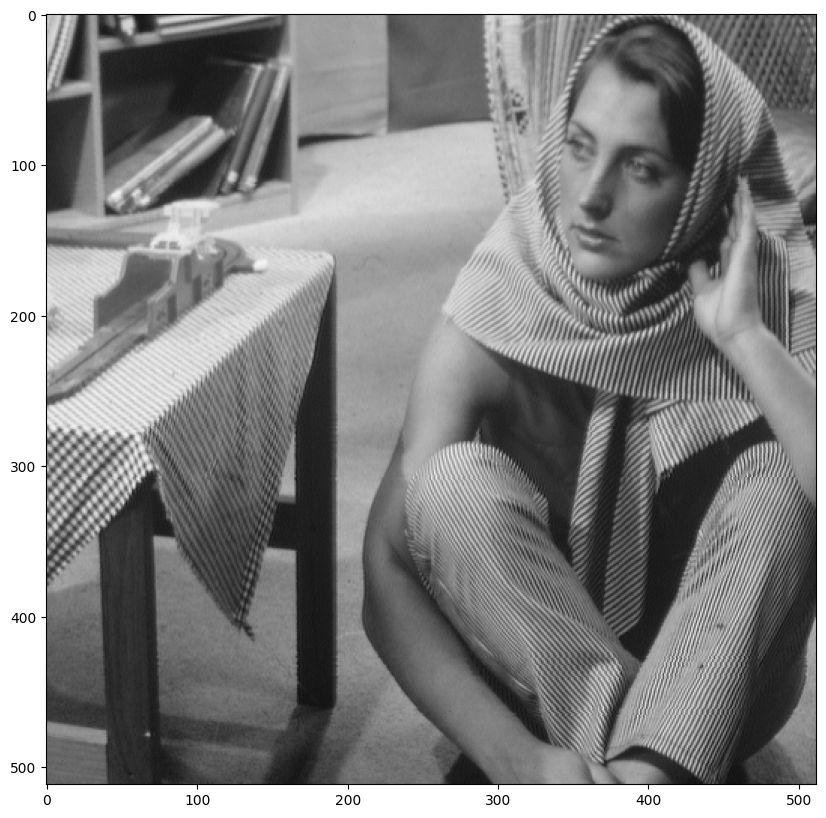

In [66]:
def loadimage(images):
    for image_path in images:
        image = cv2.imread(image_path)
        new_image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(10,10))
        plt.imshow(new_image)
        plt.show()

loadimage(images)

### Grayscale Images

Grayscale images have pixel values representing the amount of light or intensity. Light shades of gray have a high-intensity darker shades have a lower intensity. White has the highest intensity, and black the lowest. We can convert an image to Gray Scale using a color conversion code and the function <code>cvtColor</code>.

The code for RGB to gray is <code>cv2.COLOR_BGR2GRAY</code>, we apply the function:


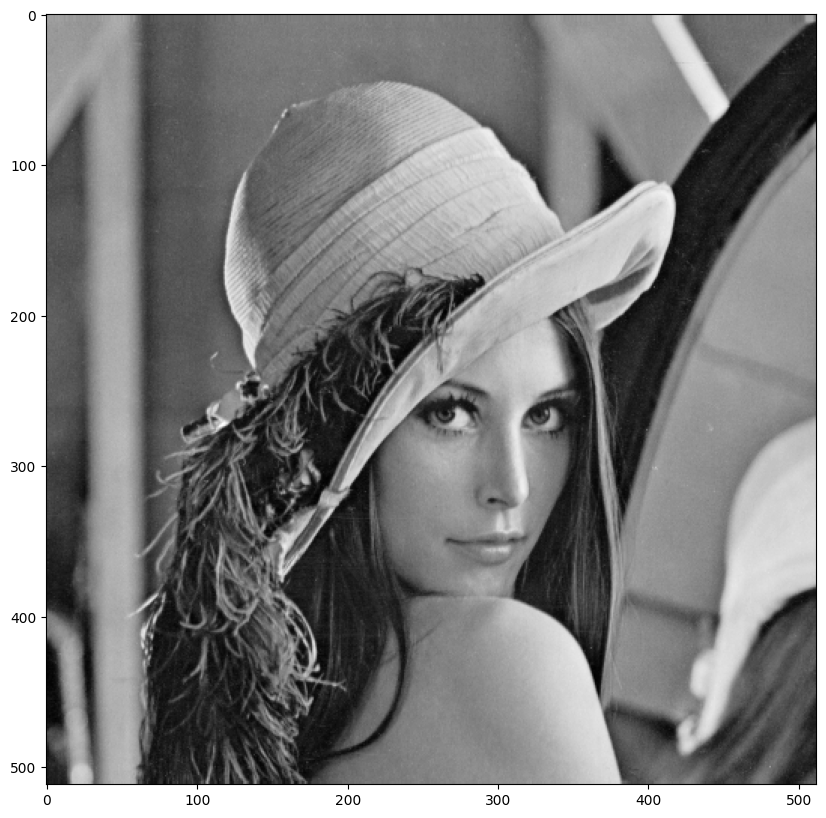

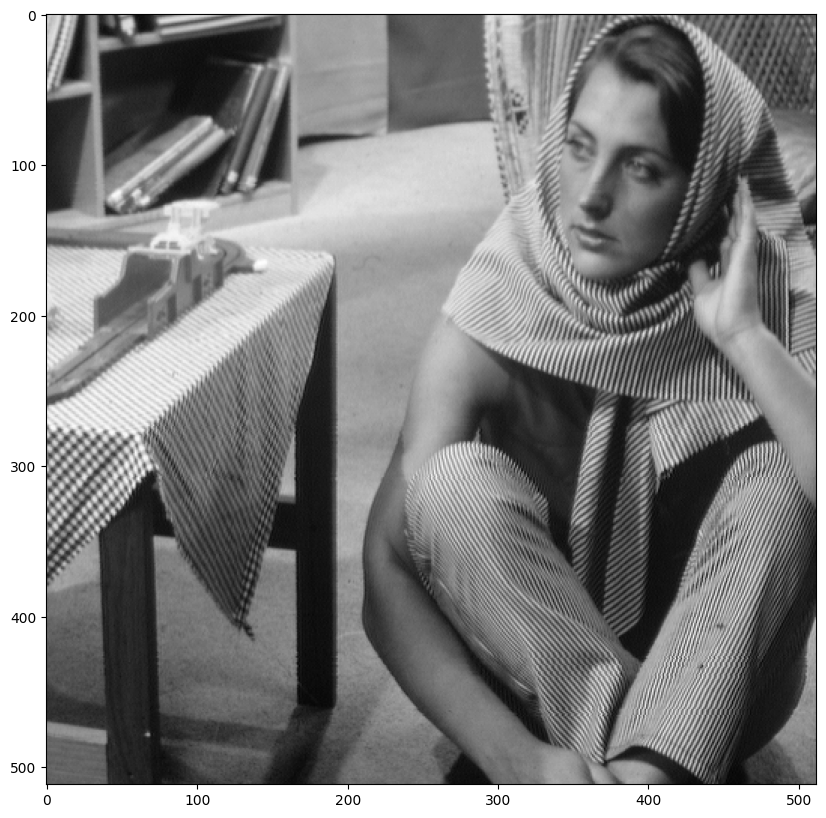

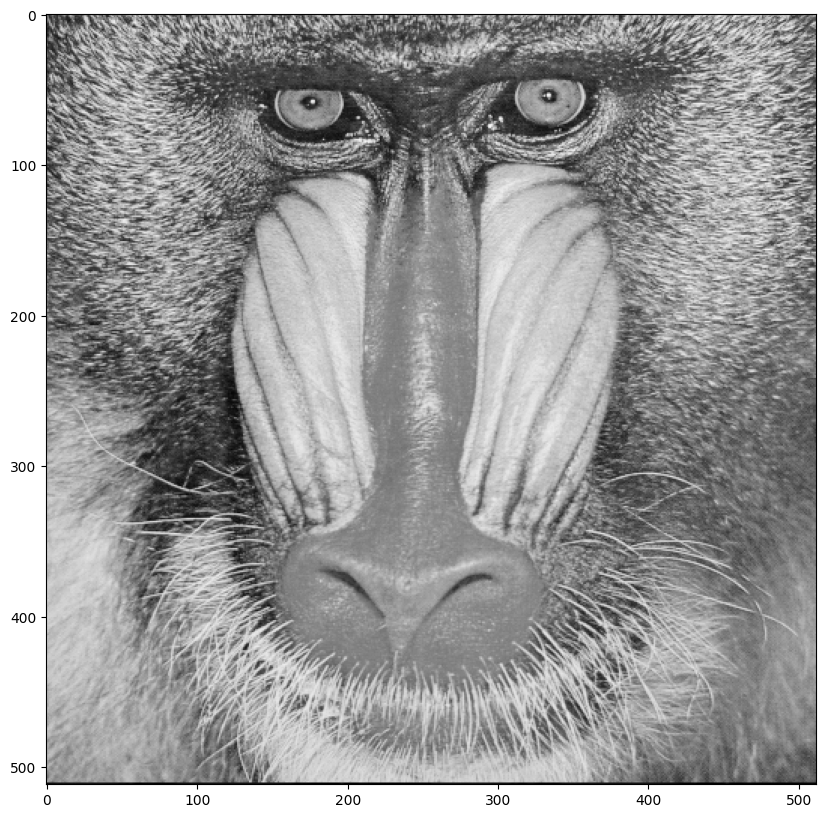

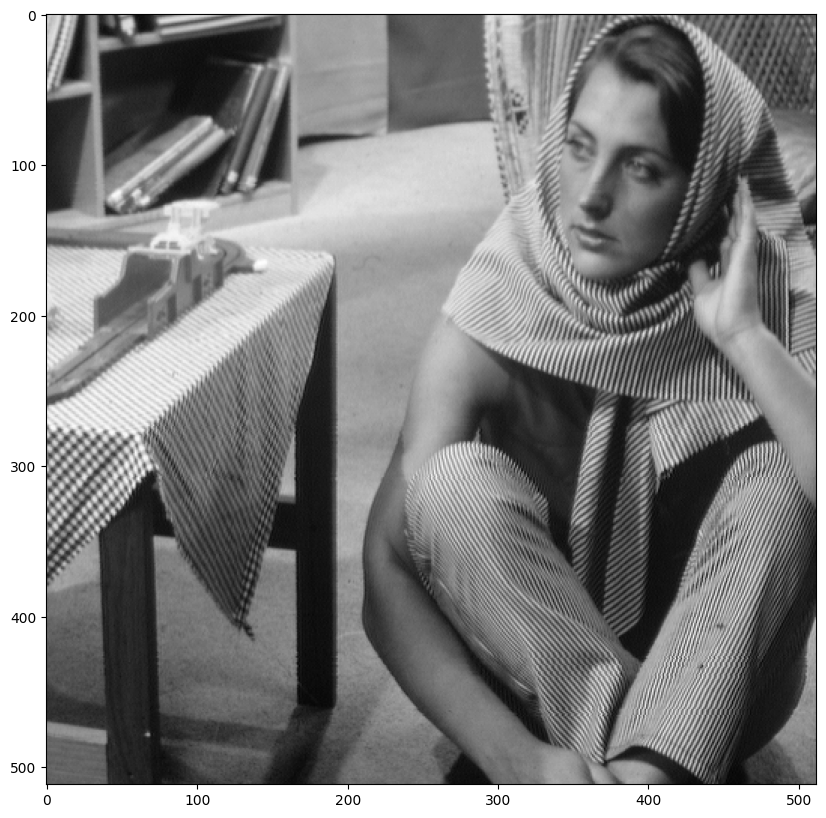

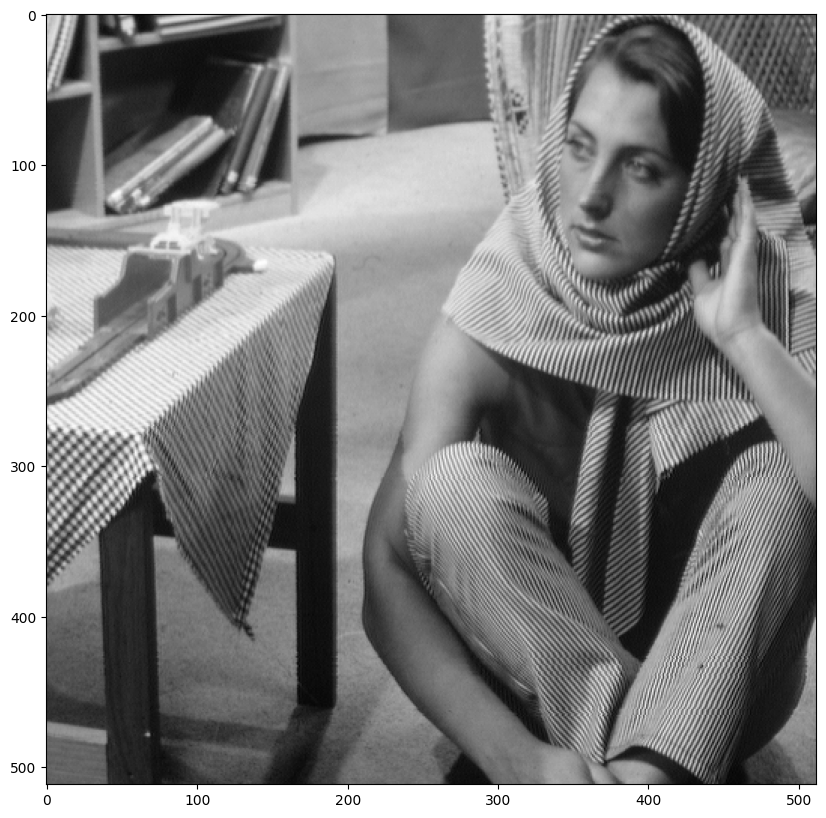

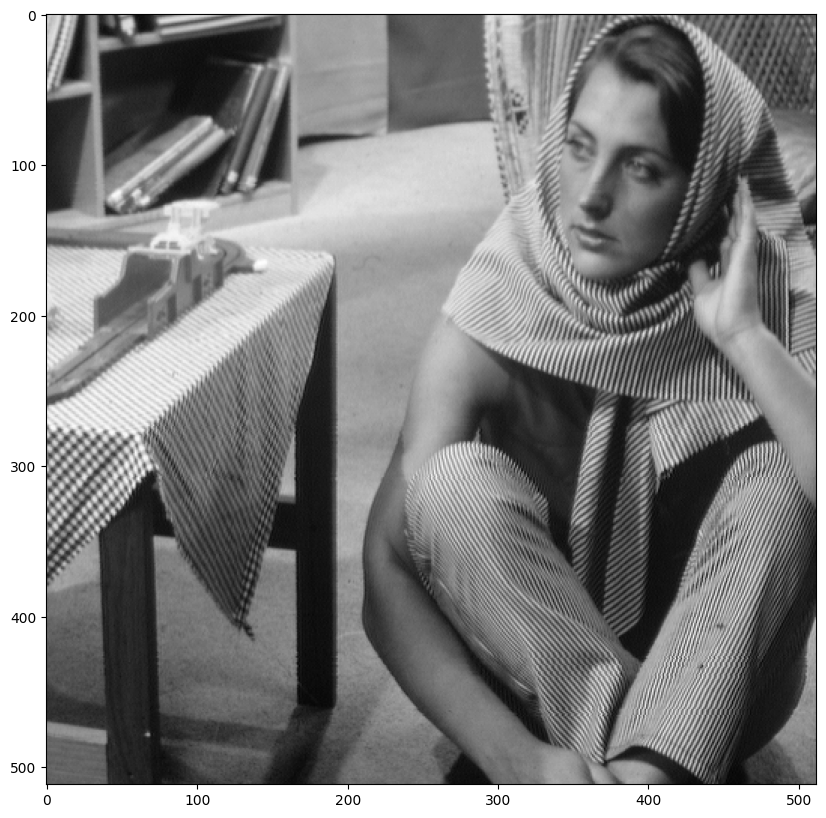

In [67]:
def loadimage(images):
    for image_path in images:
        image = cv2.imread(image_path)
        image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        
        #The image array has only two dimensions, i.e. only one color channel:
        image_gray.shape

        #We can plot the image using `imshow` but we have to specify the color map is gray:
        plt.figure(figsize=(10, 10))
        plt.imshow(image_gray, cmap='gray')
        plt.show()

        #We can save the image as a grayscale image, let's save it as a `jpg` as well, in the working directory.
        cv2.imwrite('barbara.jpg', image_gray)
        im_gray = cv2.imread('barbara.png', cv2.IMREAD_GRAYSCALE)
        plt.figure(figsize=(10,10))
        plt.imshow(im_gray,cmap='gray')
        plt.show()
        

loadimage(images)

### Color Channels  
We can also work with the different color channels. Consider the following image:


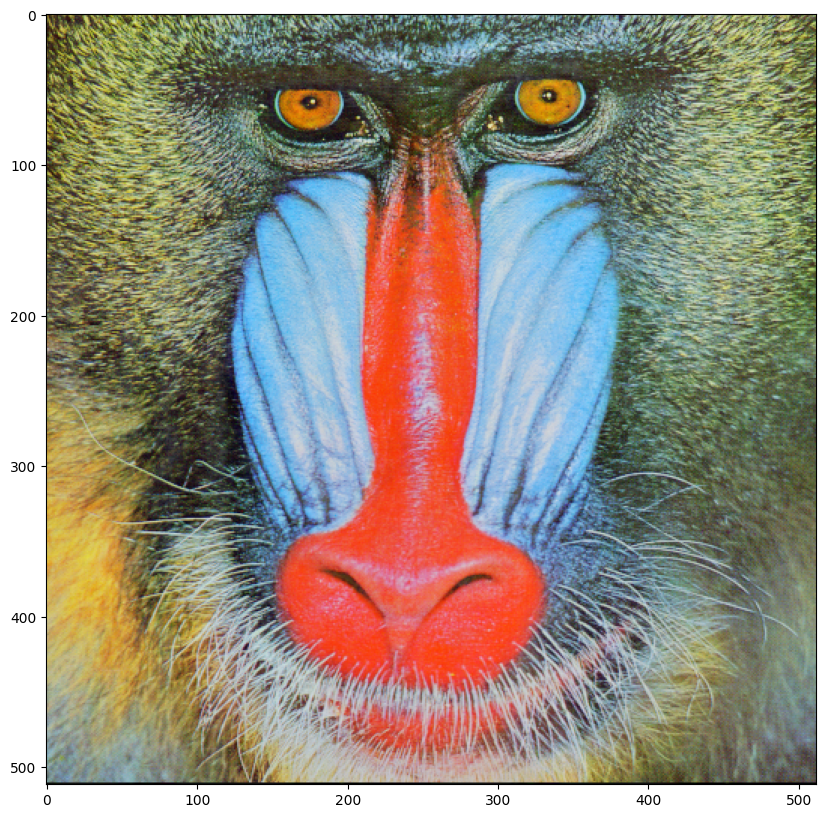

In [68]:
baboon=cv2.imread('baboon.png')
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))
plt.show()

We can obtain the different RGB colors and assign them to the variables <code>blue</code>, <code>green</code>, and <code>red</code>, in (B, G, R) format.


In [69]:
blue, green, red = baboon[:, :, 0], baboon[:, :, 1], baboon[:, :, 2]

We can concatenate each image channel the images using the function <code>vconcat</code>.


In [70]:
im_bgr = cv2.vconcat([blue, green, red])

Plotting the color image next to the red channel in grayscale, we see that regions with red have higher intensity values.


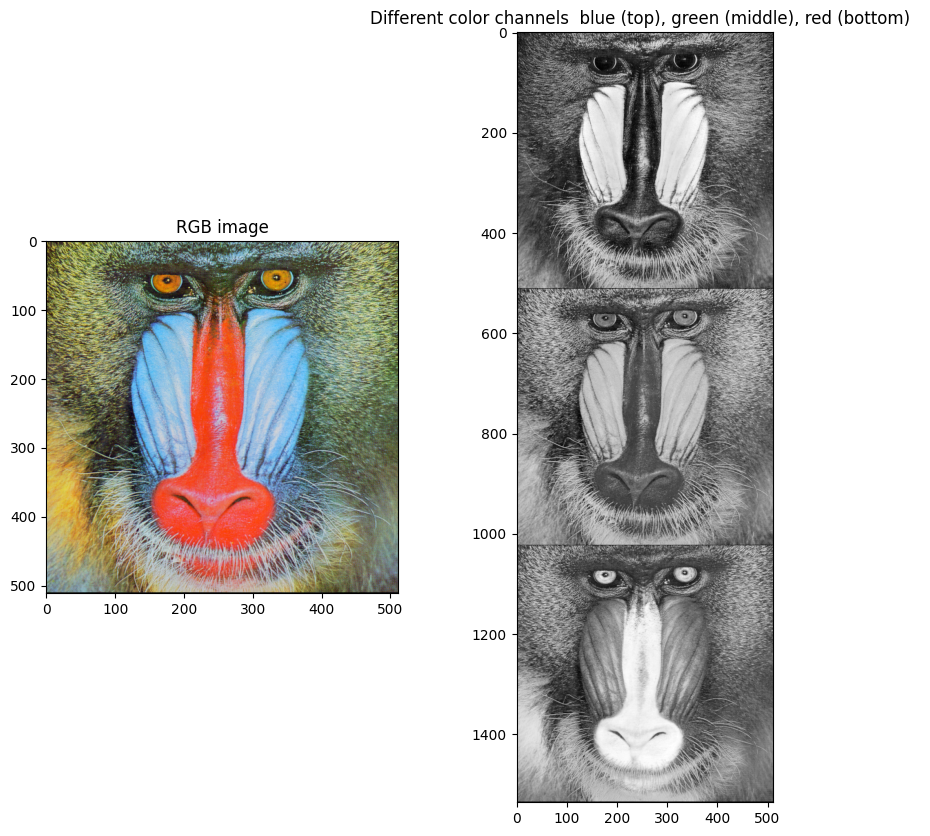

In [71]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))
plt.title("RGB image")
plt.subplot(122)
plt.imshow(im_bgr,cmap='gray')
plt.title("Different color channels  blue (top), green (middle), red (bottom)  ")
plt.show()

### Indexing  

We can use numpy slicing. For example, we can return the first 256 rows corresponding to the top half of the image:


In [77]:
rows = 256

In [78]:
plt.figure(figsize=(10,10))
plt.imshow(new_image[0:rows,:,:])
plt.show()

TypeError: string indices must be integers, not 'tuple'

<Figure size 1000x1000 with 0 Axes>

We can also return the first 256 columns corresponding to the first half of the image:


In [ ]:
columns = 256

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(new_image[:,0:columns,:])
plt.show()

If you want to reassign an array to another variable, you should use the `copy` method (we will cover this in the next section).


In [ ]:
A = new_image.copy()
plt.imshow(A)
plt.show()

If we do not apply the method `copy()`, the variable will point to the same location in memory. Consider the variable `B` below, if we set all values of array `A` to zero, since `A` and `B` points to the same object in the memory, `B` will also have all-zero elements:


In [ ]:
B = A
A[:,:,:] = 0
plt.imshow(B)
plt.show()

We can also manipulate elements using indexing. In the following piece of code, we create a new array `baboon_red` and set all but the red color channels to zero. Therefore, when we display the image, it appears red:


In [ ]:
baboon_red = baboon.copy()
baboon_red[:, :, 0] = 0
baboon_red[:, :, 1] = 0
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(baboon_red, cv2.COLOR_BGR2RGB))
plt.show()

We can do the same for blue:  


In [ ]:
baboon_blue = baboon.copy()
baboon_blue[:, :, 1] = 0
baboon_blue[:, :, 2] = 0
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB))
plt.show()

We can do the same for green:


In [ ]:
baboon_green = baboon.copy()
baboon_green[:, :, 0] = 0
baboon_green[:, :, 2] = 0
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(baboon_green, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
image=cv2.imread('baboon.png')

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
image=cv2.imread('baboon.png') # replace and add you image here name 
baboon_blue=image.copy()
baboon_blue[:,:,1] = 0
baboon_blue[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB))
plt.show()